In [1]:
import numpy as np
from pydub import AudioSegment
import random
import sys
import io
import os
import glob
import IPython
from td_utils import *
import pandas as pd
%matplotlib inline

C:\Users\HH\Anaconda3\lib\site-packages\pydub\utils.py:165: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)


In [2]:
IPython.display.Audio("./raw_data/activates/1.wav")

In [3]:
IPython.display.Audio("./raw_data/negatives/4.wav")

In [4]:
IPython.display.Audio("./raw_data/backgrounds/1.wav")

In [5]:
IPython.display.Audio("audio_examples/example_train.wav")

(101, 5511)

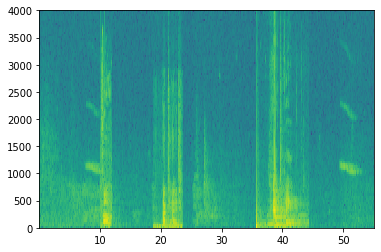

In [6]:
x = graph_spectrogram("audio_examples/example_train.wav")
x.shape

In [7]:
rate, data = wavfile.read("audio_examples/example_train.wav")
print("Time steps in audio recording before spectrogram", data[:,0].shape)
print("Time steps in input after spectrogram", x.shape)
Tx = 5511 
n_freq = 101
Ty = 1375 

Time steps in audio recording before spectrogram (441000,)
Time steps in input after spectrogram (101, 5511)


In [8]:

activates, negatives, backgrounds = load_raw_audio()

print("background len: " + str(len(backgrounds[0])))   
print("activate[0] len: " + str(len(activates[0])))     
print("activate[1] len: " + str(len(activates[1])))     


background len: 10000
activate[0] len: 721
activate[1] len: 731


In [9]:
def get_random_time_segment(segment_ms):
    segment_start = np.random.randint(low=0, high=10000-segment_ms)  
    segment_end = segment_start + segment_ms - 1    
    return (segment_start, segment_end)

In [10]:
def is_overlapping(segment_time, previous_segments):
    segment_start, segment_end = segment_time
    overlap =False    
    for previous_start, previous_end in previous_segments:
        if ((previous_start<=segment_start)&(previous_end>=segment_start)):
            overlap =True 
    return overlap

In [11]:
overlap1 = is_overlapping((950, 1430), [(2000, 2550), (260, 949)])
overlap2 = is_overlapping((2305, 2950), [(824, 1532), (1900, 2305), (3424, 3656)])
print("Overlap 1 = ", overlap1)
print("Overlap 2 = ", overlap2)

Overlap 1 =  False
Overlap 2 =  True


In [12]:
def insert_audio_clip(background, audio_clip, previous_segments):
    segment_ms = len(audio_clip)
    segment_time = get_random_time_segment(segment_ms)
    while is_overlapping(segment_time, previous_segments):
        segment_time =get_random_time_segment(segment_ms)
    previous_segments.append(segment_time)
    new_background = background.overlay(audio_clip, position = segment_time[0])   
    return new_background, segment_time

In [13]:
audio_clip, segment_time = insert_audio_clip(backgrounds[0], activates[0], [(3790, 4400)])
audio_clip.export("insert_test.wav", format="wav")
print("Segment Time: ", segment_time)
IPython.display.Audio("insert_test.wav")

Segment Time:  (3277, 3997)


In [14]:
def insert_ones(y, segment_end_ms):
    segment_end_y = int(segment_end_ms * Ty / 10000.0)
    for i in range(segment_end_y+1, segment_end_y+51):
        if i<Ty:
            y[0, i] = 1.0
    return y

sanity checks: 0.0 1.0 0.0


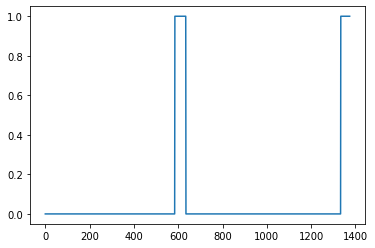

In [15]:
arr1 = insert_ones(np.zeros((1, Ty)), 9700)
plt.plot(insert_ones(arr1, 4251)[0,:])
print("sanity checks:", arr1[0][1333], arr1[0][632], arr1[0][635])

In [16]:
def create_training_example(background, activates, negatives):
    background = background - 20
    y =np.zeros((1,Ty))
    previous_segments = []
    number_of_activates = np.random.randint(0, 5)
    random_indices = np.random.randint(len(activates), size=number_of_activates)
    random_activates = [activates[i] for i in random_indices]
    for random_activate in random_activates:
        background, segment_time =insert_audio_clip(background, random_activate, previous_segments) 
        segment_start, segment_end = segment_time 
        y =insert_ones(y, segment_end)
    number_of_negatives = np.random.randint(0, 3)
    random_indices = np.random.randint(len(negatives), size=number_of_negatives)
    random_negatives = [negatives[i] for i in random_indices]
    for random_negative in random_negatives:
        
        background, _ =insert_audio_clip(background, random_negative, previous_segments) 
    background = match_target_amplitude(background, -20.0)
    file_handle = background.export("vinh2" + ".wav", format="wav")
    print("File (train.wav) was saved in your directory.")
    x = graph_spectrogram("vinh2.wav")    
    return x, y

File (train.wav) was saved in your directory.


(101, 5511)

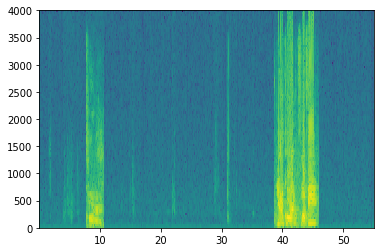

In [17]:
x, y = create_training_example(backgrounds[0], activates, negatives)
x.shape

In [18]:
IPython.display.Audio("vinh2.wav")

In [19]:
X = np.load("./XY_train/X.npz")
Y = np.load("./XY_train/Y.npz")
X_dev = np.load("./XY_dev/X_dev.npz")
Y_dev = np.load("./XY_dev/Y_dev.npz")
X=X['X']
Y=Y['Y']
X_dev=X_dev['X_dev']
Y_dev=Y_dev['Y_dev']

In [20]:
from keras.callbacks import ModelCheckpoint
from keras.models import Model, load_model, Sequential
from keras.layers import Dense, Activation, Dropout, Input, Masking, TimeDistributed, LSTM, Conv1D
from keras.layers import GRU, Bidirectional, BatchNormalization, Reshape
from keras.optimizers import Adam

Using TensorFlow backend.


In [21]:

def model(input_shape):
    X_input = Input(shape = input_shape)
    X =Conv1D(196,kernel_size=15,strides=4)(X_input)                             
    X = BatchNormalization(axis=-1)(X)                                
    X = Activation('relu')(X)                               
    X = Dropout(0.8)(X)                                 
    X = GRU(units = 128, return_sequences = True)(X)                          
    X = Dropout(0.8)(X)                               
    X =  BatchNormalization()(X)                                 
    X = GRU(units = 128, return_sequences = True)(X)                            
    X = Dropout(0.8)(X)                                     
    X =  BatchNormalization()(X)                                   
    X = Dropout(0.8)(X)                              
    X = TimeDistributed(Dense(1, activation = "sigmoid"))(X) 
    model = Model(inputs = X_input, outputs = X)    
    return model  

In [22]:
model = model(input_shape = (Tx, n_freq))
model.summary()

W1020 21:36:17.737470  5356 deprecation_wrapper.py:119] From C:\Users\HH\Anaconda3\lib\site-packages\keras\backend\tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W1020 21:36:18.174615  5356 deprecation_wrapper.py:119] From C:\Users\HH\Anaconda3\lib\site-packages\keras\backend\tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W1020 21:36:18.249411  5356 deprecation_wrapper.py:119] From C:\Users\HH\Anaconda3\lib\site-packages\keras\backend\tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W1020 21:36:18.570695  5356 deprecation_wrapper.py:119] From C:\Users\HH\Anaconda3\lib\site-packages\keras\backend\tensorflow_backend.py:133: The name tf.placeholder_with_default is deprecated. Please use tf.compat.v1.placeholder_with_default instead.

W1020 21:36:18.607598  5356 deprecation.py:506] From C:\Us

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 5511, 101)         0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 1375, 196)         297136    
_________________________________________________________________
batch_normalization_1 (Batch (None, 1375, 196)         784       
_________________________________________________________________
activation_1 (Activation)    (None, 1375, 196)         0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 1375, 196)         0         
_________________________________________________________________
gru_1 (GRU)                  (None, 1375, 128)         124800    
_________________________________________________________________
dropout_2 (Dropout)          (None, 1375, 128)         0         
__________

In [23]:
model = load_model('./models/tr_model.h5')

W1020 21:36:20.984200  5356 nn_ops.py:4224] Large dropout rate: 0.8 (>0.5). In TensorFlow 2.x, dropout() uses dropout rate instead of keep_prob. Please ensure that this is intended.
W1020 21:36:22.454490  5356 deprecation_wrapper.py:119] From C:\Users\HH\Anaconda3\lib\site-packages\keras\backend\tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.

W1020 21:36:24.909120  5356 deprecation_wrapper.py:119] From C:\Users\HH\Anaconda3\lib\site-packages\keras\optimizers.py:790: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.

W1020 21:36:24.931062  5356 deprecation.py:323] From C:\Users\HH\Anaconda3\lib\site-packages\tensorflow\python\ops\nn_impl.py:180: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where

In [24]:
opt = Adam(lr=0.0001, beta_1=0.9, beta_2=0.999, decay=0.01)
model.compile(loss='binary_crossentropy', optimizer=opt, metrics=["accuracy"])
model.fit(X, Y, batch_size = 5, epochs=1)

Epoch 1/1
26/26 [==============================] - 21s 792ms/step - loss: 0.0711 - acc: 0.9770


In [25]:
loss, acc = model.evaluate(X_dev, Y_dev)
print("Dev set accuracy = ", acc)


5/5 [==============================] - 1s 278ms/step
Dev set accuracy =  0.9271273016929626


In [26]:
def detect_triggerword(filename):
    plt.subplot(2, 1, 1)
    x = graph_spectrogram(filename)
    x  = x.swapaxes(0,1)
    x = np.expand_dims(x, axis=0)
    predictions = model.predict(x)
    
    plt.subplot(2, 1, 2)
    plt.plot(predictions[0,:,0])
    plt.ylabel('probability')
    plt.show()
    return predictions

In [30]:
chime_file = "audio_examples/chime.wav"
def chime_on_activate(filename, predictions, threshold):
    audio_clip = AudioSegment.from_wav(filename)
    chime = AudioSegment.from_wav(chime_file)
    Ty = predictions.shape[1]
    consecutive_timesteps = 0
    for i in range(Ty):
        consecutive_timesteps += 1
        if predictions[0,i,0] > threshold and consecutive_timesteps > 75:
            audio_clip = audio_clip.overlay(chime, position = ((i / Ty) * audio_clip.duration_seconds)*1000)
            consecutive_timesteps = 0       
    audio_clip.export("testchime_output.wav", format='wav')

In [31]:
IPython.display.Audio("./raw_data/dev/1.wav")

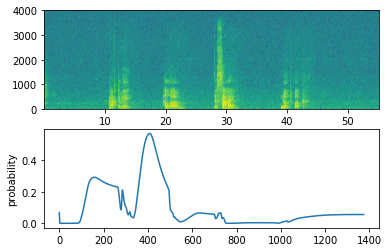

In [32]:
filename = "./raw_data/dev/1.wav"
prediction = detect_triggerword(filename)
chime_on_activate(filename, prediction, 0.5)
IPython.display.Audio("./testchime_output.wav")


In [71]:
def preprocess_audio(filename):
    padding = AudioSegment.silent(duration=10000)
    segment = AudioSegment.from_wav(filename)[:10000]
    segment = padding.overlay(segment)
    segment = segment.set_frame_rate(44100)
    segment.export(filename, format='wav')

In [73]:
your_filename = "test.wav"
preprocess_audio(your_filename)
IPython.display.Audio(your_filename)

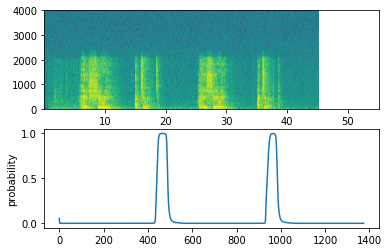

In [76]:
chime_threshold = 0.5
prediction = detect_triggerword(your_filename)
chime_on_activate(your_filename, prediction, chime_threshold)
IPython.display.Audio("./mychime_output.wav")